# 🌊🌊 **SWELLS** — *Evaluator*
[![Paper](http://img.shields.io/badge/Arxiv:2503.09454-B31B1B.svg)](https://arxiv.org/abs/2503.09454)
[![GitHub](https://img.shields.io/badge/GitHub-Repo-181717?logo=github)](https://github.com/mmarmonier/SWELLS)


This notebook evaluates the inferences obtained through OpenAI's Batch API on the SWELLS test set.

Running this notebook requires an OpenAI API key and the `file_id_mapping.json` file. Consult the Test_Set_Inferencer notebook if this is unclear to you.

# Data

In [ ]:
!wget https://github.com/mmarmonier/SWELLS/releases/download/v1.0/SWELLS_dataset.7z

In [ ]:
!7z x /content/SWELLS_dataset.7z -p"SWELLS"


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/MyDrive/                                 1 file, 299744346 bytes (286 MiB)

Extracting archive: /content/drive/MyDrive/SWELLS_dataset.7z
--
Path = /content/drive/MyDrive/SWELLS_dataset.7z
Type = 7z
Physical Size = 299744346
Headers Size = 1754
Method = LZMA2:24 7zAES
Solid = +
Blocks = 12

  0%      0% 12         0% 14 - SWELLS_Dataset/Dev/dev_French.jsonl                                               0% 15 - SWELLS_Dataset/Dev/dev_Latin.jsonl                                            

# Conlanger object

In [ ]:
import random
import re
from nltk.tokenize import sent_tokenize
import json
import nltk
#nltk.download('punkt', quiet=True)
nltk.download('punkt_tab', quiet=True)


class Conlanger:
    def __init__(self, n_consonants=9, n_vowels=5, mixed_syllable=True):
        """
        Initialize the Conlanger class, which creates a random grid of syllables
        and an optional mapping for transformations.

        Parameters:
        - n_consonants (int): Number of consonants to include in the generated grid.
        - n_vowels (int): Number of vowels to include in the generated grid.
        - mixed_syllable (bool): Whether to allow mappings between digrams and extra characters.

        Attributes:
        - all_consonants (list): Full list of possible consonants.
        - all_vowels (list): Full list of possible vowels.
        - alphabet (list): Combined list of all possible characters (consonants + vowels).
        - consonants (list): Randomly sampled consonants for the grid.
        - vowels (list): Randomly sampled vowels for the grid.
        - grid (dict): Generated syllabic grid based on consonants and vowels.
        - mapping (dict): Optional mapping between digrams and extra characters.
        """
        # Define possible consonants (basic and extended sets)
        self.all_consonants_0 = ['b', 'c', 'ç', 'd', 'f', 'g', 'h', 'j', 'k', 'l', 'm', 'n', 'p', 'q', 'r', 's', 't', 'v', 'w', 'x', 'z']
        self.all_consonants_1 = ['b', 'c', 'ç', 'd', 'f', 'g', 'h', 'j', 'k', 'l', 'm', 'n', 'ñ', 'p', 'q', 'r', 's', 't', 'v', 'w', 'x', 'z', 'þ', 'ð']

        # Choose which consonant set to use (weighted random selection)
        self.all_consonants = random.choices(
            [self.all_consonants_0, self.all_consonants_1],
            weights=[3, 1],  # Prefer the basic set (weight 3:1)
            k=1
        )[0]

        # Define possible vowels (basic and extended sets)
        self.all_vowels_0 = ['a', 'e', 'i', 'o', 'u', 'é', 'è', 'à', 'y']
        self.all_vowels_1 = ['a', 'e', 'i', 'o', 'u', 'â', 'ê', 'î', 'ô', 'û', 'é', 'è', 'à', 'œ', 'y', 'ø', 'æ']

        # Choose which vowel set to use (weighted random selection)
        self.all_vowels = random.choices(
            [self.all_vowels_0, self.all_vowels_1],
            weights=[3, 1],  # Prefer the basic set (weight 3:1)
            k=1
        )[0]

        # Combine consonants and vowels into a single alphabet
        self.alphabet = self.all_consonants + self.all_vowels

        # Validate that the grid can accommodate the alphabet
        self.n_consonants = n_consonants
        self.n_vowels = n_vowels
        assert len(self.alphabet) <= n_vowels * n_consonants, (
            "Error: n_vowels * n_consonants must be >= len(alphabet)."
        )

        # Store additional settings
        self.mixed_syllable = mixed_syllable

        # Randomly select the specific consonants and vowels for the grid
        self.consonants = random.sample(self.all_consonants, n_consonants)
        self.vowels = random.sample(self.all_vowels, n_vowels)

        # Identify remaining characters not included in the grid
        self.remaining_consonants = [c for c in self.all_consonants if c not in self.consonants]
        self.remaining_vowels = [v for v in self.all_vowels if v not in self.vowels]

        # Randomly determine whether the grid is open (CV) or closed (VC)
        self.syllabic_structure = random.choice(["open", "closed"])

        # Generate the syllabic grid
        self.grid = self.create_grid()

        # Create an optional mapping if mixed syllables are enabled
        self.mapping = {}
        if self.mixed_syllable:
            self.create_mapping()


    def create_grid(self):
        """
        Creates a syllabic grid based on the syllabic structure (open or closed).

        An open grid (CV structure) uses consonants as rows and vowels as columns.
        A closed grid (VC structure) uses vowels as rows and consonants as columns.

        Returns:
        - grid (dict): A dictionary where rows (keys) map to columns (keys) with alphabet characters as values.
        """
        # Determine grid structure: open (CV) or closed (VC)
        if self.syllabic_structure == "open":
            rows = self.consonants
            columns = self.vowels
        elif self.syllabic_structure == "closed":
            rows = self.vowels
            columns = self.consonants
        else:
            raise ValueError("Invalid syllabic structure. Must be 'open' or 'closed'.")

        # Ensure the alphabet has enough elements to fill the grid
        alphabet = self.alphabet[:]
        total_cells = len(rows) * len(columns)

        # Pad the alphabet with None if there are not enough characters
        while len(alphabet) < total_cells:
            alphabet.append(None)

        # Shuffle the alphabet to randomize grid placement
        random.shuffle(alphabet)

        # Initialize the grid as a dictionary of dictionaries
        grid = {row: {col: None for col in columns} for row in rows}

        # Fill the grid with characters from the alphabet
        index = 0
        for row in rows:
            for col in columns:
                grid[row][col] = alphabet[index]
                index += 1

        return grid


    def create_mapping(self):
        """
        Creates a mapping between randomly selected bigrams (from the grid)
        and extra characters (remaining consonants and vowels).

        This mapping is optional and used for additional text transformations.

        Attributes:
        - self.mapping (dict): Maps bigrams to extra characters.
        """
        # Generate a list of valid bigrams (row+column combinations) from the grid
        digrams = []
        for row_key, row_values in self.grid.items():
            for col_key, value in row_values.items():
                if value is not None:
                    digrams.append(f"{row_key}{col_key}")

        # Combine remaining consonants and vowels as possible replacements
        first_list = digrams
        second_list = self.remaining_consonants + self.remaining_vowels

        # Determine the number of changes (percentage of available digrams to map)
        coefficient = random.choice([0.40, 0.50, 0.66, 0.75])  # Randomly choose mapping intensity
        n_changes = min(int(len(digrams) * coefficient), len(second_list))

        # Ensure there are enough replacement characters to create the mapping
        if n_changes > len(second_list):
            raise ValueError("Error! Not enough characters to map the selected bigrams.")

        # Randomly select bigrams and replacement characters for the mapping
        selected_bigrams = random.sample(first_list, n_changes)
        selected_chars = random.sample(second_list, n_changes)

        # Create a dictionary mapping the selected bigrams to replacement characters
        self.mapping = dict(zip(selected_bigrams, selected_chars))



    def replace_bigrams(self, text):
        """
        Replaces bigrams in the text with their corresponding mapped characters.

        Parameters:
        - text (str): The input text with bigrams.

        Returns:
        - str: Text with bigrams replaced by mapped characters.
        """
        for bigram, char in self.mapping.items():
            text = text.replace(bigram, char)
        return text

    def reconstruct_original(self, text):
        """
        Reverses the replacement process by reconstructing the original bigrams.

        Parameters:
        - text (str): The input text with mapped characters.

        Returns:
        - str: Text with mapped characters replaced by original bigrams.
        """
        # Create a reverse mapping (mapped char -> original bigram)
        reverse_mapping = {v: k for k, v in self.mapping.items()}
        for char, bigram in reverse_mapping.items():
            text = text.replace(char, bigram)
        return text

    def encode_character(self, char):
        """
        Encodes a single character into grid coordinates.

        Parameters:
        - char (str): The character to encode.

        Returns:
        - str or None: Encoded bigram (row+column) or None if the character is not in the grid.
        """
        is_upper = char.isupper()
        char = char.lower()
        for row_key, row_val in self.grid.items():
            for col_key, val in row_val.items():
                if val == char:
                    # Return coordinates with appropriate case
                    return (row_key.upper() if is_upper else row_key) + col_key
        return None

    def decode_coordinates(self, coords):
        """
        Decodes grid coordinates back into a character.

        Parameters:
        - coords (str): The grid coordinates (row+column).

        Returns:
        - str or None: Decoded character or None if coordinates are invalid.
        """
        row, col = coords[0], coords[1]
        if row.lower() in self.grid and col in self.grid[row.lower()]:
            decoded_char = self.grid[row.lower()][col]
            # Return with appropriate case
            if decoded_char is not None:
              return decoded_char.upper() if row.isupper() else decoded_char
        return None

    def encode_string(self, input_string):
        """
        Encodes an entire string using the grid and optional bigram replacement.

        Parameters:
        - input_string (str): The string to encode.

        Returns:
        - str: Encoded string with characters replaced by grid coordinates and bigrams replaced if enabled.
        """
        encoded = []
        for char in input_string:
            if char.lower() in self.alphabet:
                # Encode valid characters
                encoded_char = self.encode_character(char)
                if encoded_char:
                    encoded.append(encoded_char)
            else:
                # Preserve invalid characters as-is
                encoded.append(char)

        # Combine encoded characters into a single string
        encoded_string = ''.join(encoded)

        # Apply bigram replacements if enabled
        if self.mixed_syllable:
            return self.replace_bigrams(encoded_string)
        return encoded_string

    def decode_string(self, encoded_string):
        """
        Decodes an encoded string back into the original text.

        Parameters:
        - encoded_string (str): The string to decode.

        Returns:
        - str: Decoded string with original characters restored.
        """
        # Reverse bigram replacements if enabled
        if self.mixed_syllable:
            encoded_string = self.reconstruct_original(encoded_string)

        decoded = []
        i = 0

        # Process encoded string in pairs (bigram decoding)
        while i < len(encoded_string):
            # Check if current and next character form valid coordinates
            if (i + 1 < len(encoded_string) and
                encoded_string[i].lower() in self.grid and
                encoded_string[i+1] in self.grid[encoded_string[i].lower()]):
                # Decode the bigram
                coord = encoded_string[i:i+2]
                decoded_char = self.decode_coordinates(coord)
                if decoded_char:
                    decoded.append(decoded_char)
                i += 2  # Move to the next bigram
            else:
                # Preserve invalid or standalone characters as-is
                decoded.append(encoded_string[i])
                i += 1

        return ''.join(decoded)


    @staticmethod
    def reverse_letters_in_words(input_string):
        """
        Reverses only the alphabetic letters in each word, preserving the positions of non-alphabetic characters.

        Parameters:
        - input_string (str): The input string.

        Returns:
        - str: String with letters reversed in each word.
        """
        def reverse_word(word):
            # Extract letters and their positions
            letters = [char for char in word if char.isalpha()]
            non_letters = [(i, char) for i, char in enumerate(word) if not char.isalpha()]

            # Reverse the letters
            reversed_letters = letters[::-1]

            # Reinsert non-alphabetic characters at their original positions
            for i, char in non_letters:
                reversed_letters.insert(i, char)

            return ''.join(reversed_letters)

        # Replace specific punctuation with spaces before processing
        translation_table = str.maketrans("-–'", "   ")
        input_string = input_string.translate(translation_table)

        # Reverse letters in each word
        words = input_string.split()
        reversed_words = [reverse_word(word) for word in words]

        return ' '.join(reversed_words)

    @staticmethod
    def unreverse_letters_in_words(input_string):
        """
        Reverses the effect of reverse_letters_in_words, restoring the original order of letters in each word.

        Parameters:
        - input_string (str): The input string.

        Returns:
        - str: String with letters restored to their original order.
        """
        # The operation is essentially identical to `reverse_letters_in_words`
        # because reversing twice restores the original order.
        return reverse_letters_in_words(input_string)

    def reverse_and_encode_string(self, input_string):
        """
        Reverses letters in each word of the input string and encodes the result using the grid.

        Parameters:
        - input_string (str): The string to reverse and encode.

        Returns:
        - str: Encoded string after reversing letters in each word.
        """
        # Reverse letters in words
        reversed_string = self.reverse_letters_in_words(input_string)

        # Encode the reversed string
        return self.encode_string(reversed_string)

    def decode_and_unreverse_string(self, encoded_string):
        """
        Decodes an encoded string and restores the original letter order in words.

        Parameters:
        - encoded_string (str): The encoded string to decode and unreverse.

        Returns:
        - str: Decoded string with letters restored to their original order.
        """
        # Decode the string
        decoded_string = self.decode_string(encoded_string)

        # Restore original letter order
        return self.unreverse_letters_in_words(decoded_string)

    @staticmethod
    def reverse_entire_string(text):
        """
        Reverses the entire string by:
        - Reversing sentences.
        - Adjusting punctuation, parentheses, and numbers.

        Parameters:
        - text (str): The input string.

        Returns:
        - str: The fully reversed string.
        """
        def tokenize_into_sentences(text):
            """
            Tokenizes text into sentences.

            Parameters:
            - text (str): The input text.

            Returns:
            - list: List of sentences.
            """
            return sent_tokenize(text)

        def reverse_parentheses(text):
            """
            Reverses parentheses and brackets in the text.

            Parameters:
            - text (str): The input text.

            Returns:
            - str: Text with reversed parentheses and brackets.
            """
            return text.translate(str.maketrans("()[]{}", ")(][}{"))

        def reverse_numbers_in_string(text):
            """
            Reverses numbers in the string while leaving other content unchanged.

            Parameters:
            - text (str): The input text.

            Returns:
            - str: Text with reversed numbers.
            """
            return re.sub(r'\d+', lambda x: x.group(0)[::-1], text)

        # Tokenize text into sentences
        tokenized_sentences = tokenize_into_sentences(text)
        reversed_texts = []

        for sentence in tokenized_sentences:
            # Reverse the sentence
            reversed_text = sentence[::-1]

            # Adjust punctuation at the end of the sentence
            if reversed_text and reversed_text[0] in '.?!':
                reversed_text = reversed_text[1:] + reversed_text[0]

            # Fix formatting issues (e.g., misplaced spaces)
            reversed_text = re.sub(r'\.(?!$)', '', reversed_text)
            reversed_text = re.sub(r' ,', ', ', reversed_text)
            reversed_text = re.sub(r' ;', '; ', reversed_text)

            # Reverse parentheses/brackets
            reversed_text = reverse_parentheses(reversed_text)

            # Add the processed sentence to the result
            reversed_texts.append(reversed_text.lower())

        # Join sentences without additional spaces and reverse numbers
        final_reversed_text = ' '.join(reversed_texts)
        return reverse_numbers_in_string(final_reversed_text)



    def save_to_json(self, file_path):
        """
        Saves the grid, mapping and alphabet to a single JSON file.

        Parameters:
        - file_path (str): Path to the JSON file where data will be saved.
        """
        # Combine grid and mapping into a single dictionary
        data = {
            "grid": self.grid,
            "mapping": self.mapping,
            "alphabet": self.alphabet
        }

        # Write the combined dictionary to a JSON file
        with open(file_path, 'w', encoding='utf-8') as f:
            json.dump(data, f, ensure_ascii=False, indent=4)

    def load_from_json(self, file_path):
        """
        Loads the grid, mapping and alphabet from a single JSON file.

        Parameters:
        - file_path (str): Path to the JSON file where data is stored.
        """
        # Read the combined dictionary from the JSON file
        with open(file_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

        # Extract and assign grid and mapping
        self.grid = data.get("grid", {})
        self.mapping = data.get("mapping", {})
        self.alphabet = data.get("alphabet", {})


# Batch retrieval

In [ ]:
# Replace the XXXX string with an OpenAI API key.
openAI_API_key = "XXXX"

In [ ]:
from openai import OpenAI
client = OpenAI(api_key=openAI_API_key)

client.batches.list(limit=3)

In [ ]:
from openai import OpenAI
import json
import re
import os

# Load the mapping file
mapping_file_path = "file_id_mapping.json"

with open(mapping_file_path, "r", encoding="utf-8") as f:
    file_id_mapping = json.load(f)

# Initialize OpenAI client

def list_batches(limit=100):
    """
    Retrieve batch metadata from OpenAI API.
    """
    return client.batches.list(limit=limit)


def map_batches_to_files(batches, file_id_mapping):
    """
    Map batches' output_file_ids to their respective input files based on the mapping.
    """
    batch_to_input = {}
    for batch in batches:
        for input_file, metadata in file_id_mapping.items():
            if metadata["file_id"] == batch.input_file_id:
                batch_to_input[batch.output_file_id] = input_file
    return batch_to_input


def retrieve_and_process_output(file_id, output_filename):
    """
    Retrieve a batch output file, reorder rows by `custom_id` numerically, and save to a JSONL file.
    """
    # Download the batch output file
    file_response = client.files.content(file_id)

    # Access content as text
    content_text = file_response.text

    # Split text into lines and parse each line as JSON
    output_data = [json.loads(line) for line in content_text.splitlines()]

    # Reorder by numeric part of custom_id (e.g., `request-1`, `request-10` -> sort by 1, 10)
    output_data.sort(key=lambda x: int(re.search(r'\d+', x['custom_id']).group()))

    # Write the ordered output to a JSONL file
    with open(output_filename, 'w', encoding='utf-8') as outfile:
        for item in output_data:
            json.dump(item, outfile, ensure_ascii=False)
            outfile.write('\n')

# Retrieve batch metadata
batches = list_batches(limit=100)

# Map batches to input files
batch_to_input = map_batches_to_files(batches.data, file_id_mapping)

# Download and process output files
output_dir = "./raw_inferences"
os.makedirs(output_dir, exist_ok=True)

for output_file_id, input_file in batch_to_input.items():
    # Define output filename based on the input file name
    output_filename = os.path.join(
        output_dir,
        os.path.basename(input_file).replace(".jsonl", "_raw_inferences.jsonl")
    )
    print(f"Processing batch output: {output_file_id} -> {output_filename}")
    retrieve_and_process_output(output_file_id, output_filename)


Processing batch output: file-RygKJ9YrT2KPAsMBGsyvgu -> ./raw_inferences/no_CoT_full_art_eng_test_grammar_excerpts_model-gpt-4o-mini_temp-0.05_raw_inferences.jsonl
Processing batch output: file-Ef6aaDbCWbYyfvCAv9jZz1 -> ./raw_inferences/CoT_full_eng_art_test_incidental_bitexts_model-gpt-4o-mini_temp-0.05_raw_inferences.jsonl
Processing batch output: file-FrDWyKvGWMs4dJYFQ9dx5c -> ./raw_inferences/CoT_full_art_eng_test_grammar_excerpts_model-gpt-4o-mini_temp-0.05_raw_inferences.jsonl
Processing batch output: file-Rukaw5CbsbbeGgW9FwLR2g -> ./raw_inferences/no_CoT_full_eng_art_test_incidental_bitexts_model-gpt-4o-mini_temp-0.05_raw_inferences.jsonl
Processing batch output: file-J6c3x3EJnpDkjy8FbLQSwa -> ./raw_inferences/no_CoT_full_eng_art_test_dictionary_only_model-gpt-4o-mini_temp-0.05_raw_inferences.jsonl
Processing batch output: file-6unyXRxpUdk1yDS3UD8i2J -> ./raw_inferences/no_CoT_full_art_eng_test_incidental_bitexts_model-gpt-4o-mini_temp-0.05_raw_inferences.jsonl
Processing batch 

# Join with test data

In [ ]:
!pip install sacrebleu

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.8/51.8 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 4.9 MB/s eta 0:00:00


In [ ]:
import json
import re
import os
from glob import glob
import sacrebleu


def compute_accuracy_and_grade(reference, translation, adj_error_reference, instance_type):
    # Normalize case and remove punctuation
    reference = reference.lower()
    if translation == None:
        accuracy_score = 0
        chrf = 0
    else:
        translation = translation.lower().replace(".", "")
        adj_error_reference = adj_error_reference.lower()

        # Computing accuracy score and ChrF++
        if "art_eng" in instance_type:
            chrf = sacrebleu.sentence_chrf(translation, [reference], word_order=2).score
            if translation == reference:
                accuracy_score = 1
            elif translation == adj_error_reference and translation != "":
                accuracy_score = 0.5
            else:
                accuracy_score = 0
        elif instance_type[0] not in list("89"):
            chrf = sacrebleu.sentence_chrf(translation, [reference], word_order=2).score
            if translation == reference:
                accuracy_score = 1
            elif translation == adj_error_reference and translation != "":
                accuracy_score = 0.5
            else:
                accuracy_score = 0
        else:
            chrf = sacrebleu.sentence_chrf(translation, [reference]).score
            reference = sorted(reference.split())
            translation = sorted(translation.split())
            if translation == reference:
                accuracy_score = 1
            else:
                accuracy_score = 0

    # Computing grade
    count_of_As = instance_type.count('A')
    count_of_Bs = instance_type.count('B') * 2
    count_of_Cs = instance_type.count('C') * 3

    grade = accuracy_score * (count_of_As + count_of_Bs + count_of_Cs)
    grade_max = 1 * (count_of_As + count_of_Bs + count_of_Cs)


    return accuracy_score*100, grade, chrf

def extract_translation_from_completion(completion_text):
    """
    Extracts the content between <translation>...</translation> tags in the GPT completion.
    """
    match = re.search(r'<translation>(.*?)</translation>', completion_text, re.DOTALL)
    if match:
        return match.group(1).strip()
    return ""

def match_files(test_dir, raw_inferences_dir):
    """
    Match files from `test_directory` and `raw_inferences` directories based on exact identifiers.

    Returns:
    - List of tuples: [(metadata_file, inference_file, output_file), ...]
    """

    test_files = glob(os.path.join(test_dir, "**", "*.jsonl"), recursive=True)
    inference_files = glob(os.path.join(raw_inferences_dir, "**", "*.jsonl"), recursive=True)

    file_pairs = []

    for meta_file in test_files:
        # Extract unique identifier from metadata file name (everything before `.jsonl`)
        meta_identifier = os.path.basename(meta_file).split(".jsonl")[0]

        # Look for exact matches after trimming inference file names
        matched_inferences = [
            inf_file for inf_file in inference_files
            if os.path.basename(inf_file).split("_model")[0] == meta_identifier
        ]


        if len(matched_inferences) == 1:  # Ensure a single match
            inference_file = matched_inferences[0]
            model_temp_etc = inference_file.split("/")[-1].split("_model")[1]
            output_file = f"merged_{meta_identifier}_output{model_temp_etc}"
            file_pairs.append((meta_file, inference_file, output_file))
        elif len(matched_inferences) > 1:
            print(f"Ambiguous matches for {meta_file}: {matched_inferences}")
        else:
            print(f"No match found for {meta_file}")

    return file_pairs

def merge_files(metadata_file, inference_file, output_file):
    with open(metadata_file, 'r', encoding='utf-8') as meta_f:
        metadata_lines = [json.loads(line) for line in meta_f]
        metadata_dict = {line['instance_id']: line for line in metadata_lines}

    with open(output_file, 'w', encoding='utf-8') as out_f:
        with open(inference_file, 'r', encoding='utf-8') as inf_f:
            for line in inf_f:
                inference = json.loads(line)
                custom_id = inference.get("custom_id")

                metadata = metadata_dict.get(custom_id)
                if metadata:
                    gpt_completion = inference['response']['body']['choices'][0]['message']['content']
                    extracted_translation = extract_translation_from_completion(gpt_completion).strip()

                    instance_type = metadata.get("instance_type")
                    if "art_eng" in instance_type:
                        reference = metadata.get("reference")
                        translation = extracted_translation
                        adj_error_reference = metadata.get("adjective_order_error_reference")
                        model_accuracy_score, model_grade, chrf = compute_accuracy_and_grade(reference, translation, adj_error_reference, instance_type)
                    elif "eng_art" in instance_type:
                        reference = metadata.get("ciphered_reference")
                        translation = extracted_translation
                        adj_error_reference = metadata.get("ciphered_adjective_order_error_reference")
                        model_accuracy_score, model_grade, chrf = compute_accuracy_and_grade(reference, translation, adj_error_reference, instance_type)

                    decoded_translation = ""
                    try:
                        if "eng_art" in instance_type and translation:
                            conlanger = Conlanger()
                            conlanger.alphabet = metadata.get("alphabet")
                            conlanger.grid = metadata.get("grid")
                            conlanger.mapping = metadata.get("mapping")
                            if "substitutions" in instance_type:
                                decoded_translation = conlanger.decode_string(translation)
                            elif "transpositions" in instance_type:
                                decoded_translation = conlanger.reverse_entire_string(conlanger.decode_string(translation.lower()))
                    except Exception as e:
                        print(f"An error occurred: {e}")

                    merged_line = {
                        "instance_id": metadata.get("instance_id"),
                        "prompt": metadata.get("prompt"),
                        "gpt_completion": gpt_completion,
                        "extracted_translation": extracted_translation,
                        "decoded_translation": decoded_translation,
                        "source": metadata.get("source"),
                        "adj_order_error": metadata.get("adjective_order_error", ""),
                        "reference": metadata.get("reference"),
                        "ciphered_reference": metadata.get("ciphered_reference", ""),
                        "ciphered_source": metadata.get("ciphered_source", ""),
                        "ciphered_adj_order_error_reference": metadata.get("ciphered_adjective_order_error_reference", ""),
                        "grid": metadata.get("grid"),
                        "mapping": metadata.get("mapping"),
                        "alphabet": metadata.get("alphabet"),
                        "instance_type": metadata.get("instance_type"),
                        "model_accuracy_score": model_accuracy_score,
                        "model_grade": model_grade,
                        "chrf": chrf
                    }

                    out_f.write(json.dumps(merged_line, ensure_ascii=False) + '\n')
                else:
                  print(f"ERROR: {inference_file} has no metadata!")
                  break

# After running the code, you can inspect faulty_examples for debugging
# Directories
test_dir = "/content/SWELLS_Dataset/Test"
raw_inferences_dir = "./raw_inferences"
output_dir = "./inferences"
os.makedirs(output_dir, exist_ok=True)

# Match files and merge them
file_pairs = match_files(test_dir, raw_inferences_dir)

#print(file_pairs)
for metadata_file, inference_file, output_file in file_pairs:
    output_path = os.path.join(output_dir, output_file)
    print(f"Merging {metadata_file} and {inference_file} -> {output_path}")
    merge_files(metadata_file, inference_file, output_path)


Merging /content/SWELLS_Dataset/Test/Test_CoT/CoT_full_eng_art_test_dictionary_only.jsonl and ./raw_inferences/CoT_full_eng_art_test_dictionary_only_model-gpt-4o-mini_temp-0.05_raw_inferences.jsonl -> ./inferences/merged_CoT_full_eng_art_test_dictionary_only_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl
Merging /content/SWELLS_Dataset/Test/Test_CoT/CoT_full_art_eng_test_incidental_bitexts.jsonl and ./raw_inferences/CoT_full_art_eng_test_incidental_bitexts_model-gpt-4o-mini_temp-0.05_raw_inferences.jsonl -> ./inferences/merged_CoT_full_art_eng_test_incidental_bitexts_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl
Merging /content/SWELLS_Dataset/Test/Test_CoT/CoT_full_eng_art_test_incidental_bitexts.jsonl and ./raw_inferences/CoT_full_eng_art_test_incidental_bitexts_model-gpt-4o-mini_temp-0.05_raw_inferences.jsonl -> ./inferences/merged_CoT_full_eng_art_test_incidental_bitexts_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl
Merging /content/SWELLS_Dataset/Test/Test_CoT/CoT_full_

# Quantitative Analysis

## ART-ENG

### Accuracy

In [ ]:
import os
import json
import pandas as pd

# Define the directory containing the JSONL files
directory = "./inferences"

# Initialize a dictionary to store scores for each file and instance type
results = {}

# List of instance_type prefixes to group by
instance_type_prefixes = ["1.", "2m.", "2f.", "3.", "4.", "5m.", "5f.", "6", "7m.", "7f.", "8a", "8g", "9a", "9g"]

# Iterate through all files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".jsonl") and "art_eng" in filename:
        filepath = os.path.join(directory, filename)

        # Initialize a dictionary to calculate averages by instance_type
        type_scores = {prefix: {'total_score': 0, 'count': 0} for prefix in instance_type_prefixes}

        # Open and read the JSONL file
        with open(filepath, 'r') as file:
            for line in file:
                # Parse the JSON line
                instance = json.loads(line)

                # Extract the model_accuracy_score and instance_type
                score = instance.get("model_accuracy_score", None)
                instance_type = instance.get("instance_type", "")

                if score is not None:
                    # Check which prefix the instance_type starts with
                    for prefix in instance_type_prefixes:
                        if instance_type.startswith(prefix):
                            type_scores[prefix]['total_score'] += score
                            type_scores[prefix]['count'] += 1
                            break
                else:
                  print("ALERT - No score!")

        # Calculate the average scores for each instance type
        averages = {}
        for prefix, data in type_scores.items():
            if data['count'] > 0:
                averages[prefix] = data['total_score'] / data['count']
            else:
                averages[prefix] = None

        results[filename] = averages

# Create a DataFrame to display the results
all_data = []
for filename, averages in results.items():
    for instance_type, avg_score in averages.items():
        all_data.append({
            'File Name': filename,
            'Instance Type': instance_type,
            'Average Model Accuracy Score': avg_score
        })

df = pd.DataFrame(all_data)

# Sort the DataFrame for clarity
df.sort_values(by=['File Name', 'Instance Type'], inplace=True)

# Display the result
print(df)

# Optionally save the result to a CSV file
df.to_csv("/content/average_scores_by_instance_type__art_eng.csv", index=False)


                                            File Name Instance Type  \
0   merged_CoT_full_art_eng_test_dictionary_only_o...            1.   
2   merged_CoT_full_art_eng_test_dictionary_only_o...           2f.   
1   merged_CoT_full_art_eng_test_dictionary_only_o...           2m.   
3   merged_CoT_full_art_eng_test_dictionary_only_o...            3.   
4   merged_CoT_full_art_eng_test_dictionary_only_o...            4.   
..                                                ...           ...   
64  merged_no_CoT_full_art_eng_test_incidental_bit...           7m.   
66  merged_no_CoT_full_art_eng_test_incidental_bit...            8a   
67  merged_no_CoT_full_art_eng_test_incidental_bit...            8g   
68  merged_no_CoT_full_art_eng_test_incidental_bit...            9a   
69  merged_no_CoT_full_art_eng_test_incidental_bit...            9g   

    Average Model Accuracy Score  
0                            3.0  
2                            6.0  
1                            5.0  
3      

In [ ]:
import pandas as pd

# Load the CSV file
csv_file_path = "/content/average_scores_by_instance_type__art_eng.csv"
df = pd.read_csv(csv_file_path)

# Define the instance type prefixes
instance_type_prefixes = ["1.", "2m", "2f", "3.", "4.", "5m.", "5f.", "6", "7m.", "7f.", "8a", "8g", "9a", "9g"]

# Define file category mappings
partition_mapping_refined = {
    "merged_no_CoT_full_art_eng_test_dictionary_only": "W (no CoT)",
    "merged_CoT_full_art_eng_test_dictionary_only": "W (CoT)",
    "merged_no_CoT_full_art_eng_test_incidental_bitexts": "W + IB (no CoT)",
    "merged_CoT_full_art_eng_test_incidental_bitexts": "W + IB (CoT)",
    "merged_no_CoT_full_art_eng_test_grammar_excerpts": "W + G (no CoT)",
    "merged_CoT_full_art_eng_test_grammar_excerpts": "W + G (CoT)"
}

# Initialize a dictionary to store reshaped data
reshaped_data_by_instance_type = {
    "Instance Type": instance_type_prefixes
}

# Add columns for each file category
for file_category in partition_mapping_refined.values():
    reshaped_data_by_instance_type[file_category] = []

# Calculate average scores grouped by instance types for each file category
for prefix in instance_type_prefixes:
    for key, file_category in partition_mapping_refined.items():
        # Filter rows based on file name and instance type prefix
        filtered_rows = df[(df['File Name'].str.contains(key)) & (df['Instance Type'].str.startswith(prefix))]
        avg_score = filtered_rows['Average Model Accuracy Score'].mean() if not filtered_rows.empty else None
        reshaped_data_by_instance_type[file_category].append(avg_score)

# Create a reshaped DataFrame for instance types
reshaped_df_by_instance_type = pd.DataFrame(reshaped_data_by_instance_type)

# Calculate macro-averages (mean of column averages)
macro_averages = reshaped_df_by_instance_type.iloc[:, 1:].mean(axis=0).tolist()


# Add rows for macro- and micro-averages
macro_average_row = {"Instance Type": "Average"}
macro_average_row.update(dict(zip(reshaped_df_by_instance_type.columns[1:], macro_averages)))
reshaped_df_by_instance_type = pd.concat([
    reshaped_df_by_instance_type,
    pd.DataFrame([macro_average_row])
], ignore_index=True)

# Round figures to the nearest unit
reshaped_df_by_instance_type.iloc[:, 1:] = reshaped_df_by_instance_type.iloc[:, 1:].round(1)

# Display the resulting DataFrame
print(reshaped_df_by_instance_type)


   Instance Type  W (no CoT)  W (CoT)  W + IB (no CoT)  W + IB (CoT)  \
0             1.         0.0      3.0             48.0          66.0   
1             2m         0.0      5.0             21.0          56.0   
2             2f         0.0      6.0             47.0          65.0   
3             3.         0.0      0.0             35.0          23.0   
4             4.         0.0      0.0              5.0           9.0   
5            5m.         0.0      0.0              3.0           7.0   
6            5f.         0.0      0.0              8.0           7.0   
7              6         0.0      0.0              4.0           2.0   
8            7m.         0.0      0.0              1.0           2.0   
9            7f.         0.0      0.0              2.0           2.0   
10            8a         6.0      8.0              6.0          13.0   
11            8g        13.0      8.0             15.0          19.0   
12            9a         4.0      6.0              4.0          

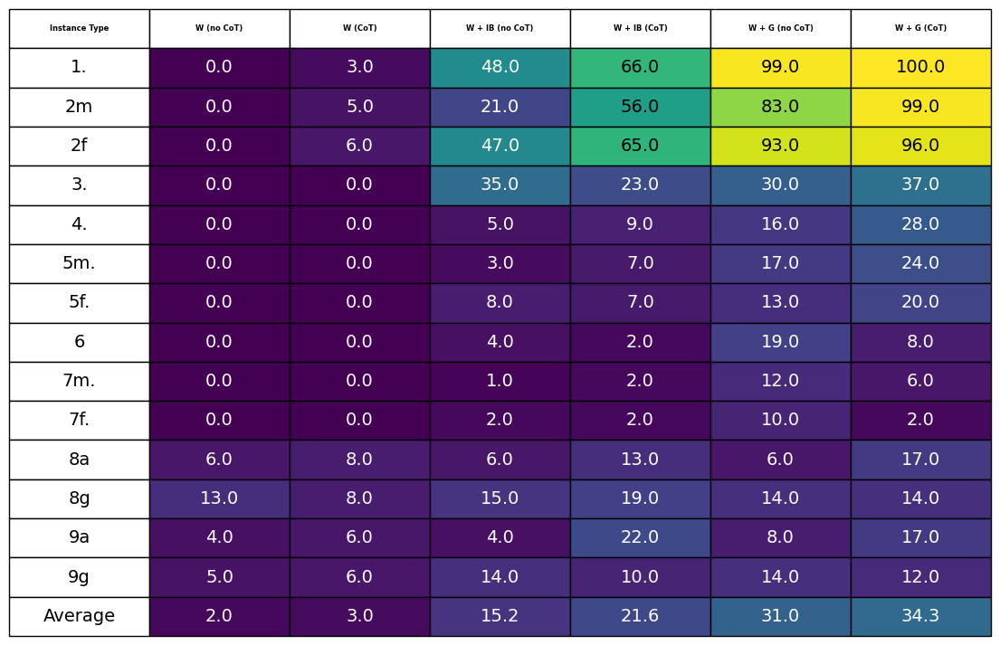

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# Define the colormap (Viridis) and setup normalization based on existing numerical data
cmap = plt.cm.viridis
numeric_columns = reshaped_df_by_instance_type.columns[1:]  # Exclude "Instance Type"
vmin = reshaped_df_by_instance_type[numeric_columns].min().min()  # Minimum value across all numeric cells
vmax = reshaped_df_by_instance_type[numeric_columns].max().max()  # Maximum value across all numeric cells
norm = mcolors.Normalize(vmin=0, vmax=100)

# Create the plot and table
fig, ax = plt.subplots(figsize=(14, len(reshaped_df_by_instance_type) * 0.6))  # Increase figure size
ax.axis('off')  # Turn off the axes

# Build the table
table_data = reshaped_df_by_instance_type.values.tolist()
table = ax.table(
    cellText=table_data,
    colLabels=reshaped_df_by_instance_type.columns,
    cellLoc='center',
    loc='center',
    bbox=[0, 0, 1, 1]  # Adjust as needed
)

# Disable automatic font size adjustments and manually set font size
table.auto_set_font_size(False)
table.set_fontsize(14)  # Increase font size
#table.auto_set_column_width(reshaped_df_by_instance_type.columns)  # Adjust column widths

# Apply colors to cells based on their values
for (row, col), cell in table.get_celld().items():
    if row == 0:  # Header row
        cell.set_fontsize(6)  # Larger font for headers
        cell.set_text_props(weight='bold')
    elif col > 0:  # Only color numeric columns (start from second column)
        numeric_col_idx = col
        if numeric_col_idx <= len(numeric_columns):  # Ensure within bounds
            value = reshaped_df_by_instance_type.iloc[row - 1, numeric_col_idx]
            if isinstance(value, (int, float)) and not pd.isna(value):  # Ensure the value is numeric
                color = cmap(norm(value))
                cell.set_facecolor(color)
                cell.set_text_props(color="white" if norm(value) < 0.5 else "black")
    # Adjust cell height and text size for readability
    cell.set_height(0.04)  # Adjust cell height for legibility

plt.show()


## ENG-ART

### Accuracy

In [ ]:
import os
import json
import pandas as pd

# Define the directory containing the JSONL files
directory = "./inferences"

# Initialize a dictionary to store scores for each file and instance type
results = {}

# List of instance_type prefixes to group by
instance_type_prefixes = ["1.", "2m.", "2f.", "3.", "4.", "5m.", "5f.", "6", "7m.", "7f.", "8a", "8g", "9a", "9g"]

# Iterate through all files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".jsonl") and "eng_art" in filename:
        filepath = os.path.join(directory, filename)

        # Initialize a dictionary to calculate averages by instance_type
        type_scores = {prefix: {'total_score': 0, 'count': 0} for prefix in instance_type_prefixes}

        # Open and read the JSONL file
        with open(filepath, 'r') as file:
            for line in file:
                # Parse the JSON line
                instance = json.loads(line)

                # Extract the model_accuracy_score and instance_type
                score = instance.get("model_accuracy_score", None)
                instance_type = instance.get("instance_type", "")

                if score is not None:
                    # Check which prefix the instance_type starts with
                    for prefix in instance_type_prefixes:
                        if instance_type.startswith(prefix):
                            type_scores[prefix]['total_score'] += score
                            type_scores[prefix]['count'] += 1
                            break
                else:
                  print("ALERT-Score is none!")

        # Calculate the average scores for each instance type
        averages = {}
        for prefix, data in type_scores.items():
            if data['count'] > 0:
                averages[prefix] = data['total_score'] / data['count']
            else:
                averages[prefix] = None

        results[filename] = averages

# Create a DataFrame to display the results
all_data = []
for filename, averages in results.items():
    for instance_type, avg_score in averages.items():
        all_data.append({
            'File Name': filename,
            'Instance Type': instance_type,
            'Average Model Accuracy Score': avg_score
        })

df = pd.DataFrame(all_data)

# Sort the DataFrame for clarity
df.sort_values(by=['File Name', 'Instance Type'], inplace=True)

# Display the result
print(df)

# Optionally save the result to a CSV file
df.to_csv("/content/average_scores_by_instance_type__eng_art.csv", index=False)


                                            File Name Instance Type  \
28  merged_CoT_full_eng_art_test_dictionary_only_o...            1.   
30  merged_CoT_full_eng_art_test_dictionary_only_o...           2f.   
29  merged_CoT_full_eng_art_test_dictionary_only_o...           2m.   
31  merged_CoT_full_eng_art_test_dictionary_only_o...            3.   
32  merged_CoT_full_eng_art_test_dictionary_only_o...            4.   
..                                                ...           ...   
50  merged_no_CoT_full_eng_art_test_incidental_bit...           7m.   
52  merged_no_CoT_full_eng_art_test_incidental_bit...            8a   
53  merged_no_CoT_full_eng_art_test_incidental_bit...            8g   
54  merged_no_CoT_full_eng_art_test_incidental_bit...            9a   
55  merged_no_CoT_full_eng_art_test_incidental_bit...            9g   

    Average Model Accuracy Score  
28                           0.0  
30                           0.0  
29                           0.0  
31     

In [ ]:
import pandas as pd

# Load the CSV file
csv_file_path = "/content/average_scores_by_instance_type__eng_art.csv"
df = pd.read_csv(csv_file_path)

# Define the instance type prefixes
instance_type_prefixes = ["1.", "2m", "2f", "3.", "4.", "5m.", "5f.", "6", "7m.", "7f.", "8a", "8g", "9a", "9g"]


# Define file category mappings
partition_mapping_refined = {
    "merged_no_CoT_full_eng_art_test_dictionary_only": "W (no CoT)",
    "merged_CoT_full_eng_art_test_dictionary_only": "W (CoT)",
    "merged_no_CoT_full_eng_art_test_incidental_bitexts": "W + IB (no CoT)",
    "merged_CoT_full_eng_art_test_incidental_bitexts": "W + IB (CoT)",
    "merged_no_CoT_full_eng_art_test_grammar_excerpts": "W + G (no CoT)",
    "merged_CoT_full_eng_art_test_grammar_excerpts": "W + G (CoT)"
}

# Initialize a dictionary to store reshaped data
reshaped_data_by_instance_type = {
    "Instance Type": instance_type_prefixes
}

# Add columns for each file category
for file_category in partition_mapping_refined.values():
    reshaped_data_by_instance_type[file_category] = []

# Calculate average scores grouped by instance types for each file category
for prefix in instance_type_prefixes:
    for key, file_category in partition_mapping_refined.items():
        # Filter rows based on file name and instance type prefix
        filtered_rows = df[(df['File Name'].str.contains(key)) & (df['Instance Type'].str.startswith(prefix))]
        avg_score = filtered_rows['Average Model Accuracy Score'].mean() if not filtered_rows.empty else None
        reshaped_data_by_instance_type[file_category].append(avg_score)

# Create a reshaped DataFrame for instance types
reshaped_df_by_instance_type = pd.DataFrame(reshaped_data_by_instance_type)

# Calculate macro-averages (mean of column averages)
macro_averages = reshaped_df_by_instance_type.iloc[:, 1:].mean(axis=0).tolist()


# Add rows for macro- and micro-averages
macro_average_row = {"Instance Type": "Average"}
macro_average_row.update(dict(zip(reshaped_df_by_instance_type.columns[1:], macro_averages)))
reshaped_df_by_instance_type = pd.concat([
    reshaped_df_by_instance_type,
    pd.DataFrame([macro_average_row])
], ignore_index=True)

# Round figures to the nearest unit
reshaped_df_by_instance_type.iloc[:, 1:] = reshaped_df_by_instance_type.iloc[:, 1:].round(1)

# Display the resulting DataFrame
print(reshaped_df_by_instance_type)


   Instance Type  W (no CoT)  W (CoT)  W + IB (no CoT)  W + IB (CoT)  \
0             1.         0.0      0.0             10.0          15.0   
1             2m         0.0      0.0              2.5           1.5   
2             2f         0.0      0.0              0.0           0.0   
3             3.         0.0      0.0             15.0           9.0   
4             4.         0.0      0.0              0.0           1.0   
5            5m.         0.0      0.0              0.0           0.0   
6            5f.         0.0      0.0              0.0           0.0   
7              6         0.0      0.0              0.0           0.0   
8            7m.         0.0      0.0              0.0           0.0   
9            7f.         0.0      0.0              0.0           0.0   
10            8a         0.0      0.0              0.0           2.0   
11            8g         0.0      0.0              1.0           0.0   
12            9a         0.0      0.0              0.0          

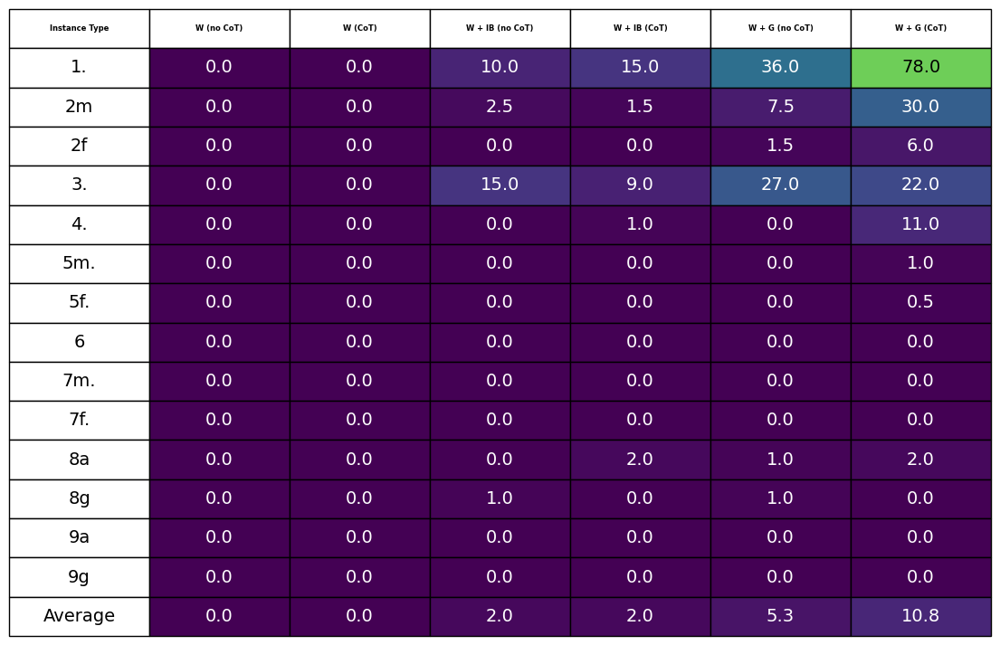

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# Define the colormap (Viridis) and setup normalization based on existing numerical data
cmap = plt.cm.viridis
numeric_columns = reshaped_df_by_instance_type.columns[1:]  # Exclude "Instance Type"
vmin = reshaped_df_by_instance_type[numeric_columns].min().min()  # Minimum value across all numeric cells
vmax = reshaped_df_by_instance_type[numeric_columns].max().max()  # Maximum value across all numeric cells
norm = mcolors.Normalize(vmin=0, vmax=100)

# Create the plot and table
fig, ax = plt.subplots(figsize=(14, len(reshaped_df_by_instance_type) * 0.6))  # Increase figure size
ax.axis('off')  # Turn off the axes

# Build the table
table_data = reshaped_df_by_instance_type.values.tolist()
table = ax.table(
    cellText=table_data,
    colLabels=reshaped_df_by_instance_type.columns,
    cellLoc='center',
    loc='center',
    bbox=[0, 0, 1, 1]  # Adjust as needed
)

# Disable automatic font size adjustments and manually set font size
table.auto_set_font_size(False)
table.set_fontsize(14)  # Increase font size
#table.auto_set_column_width(reshaped_df_by_instance_type.columns)  # Adjust column widths

# Apply colors to cells based on their values
for (row, col), cell in table.get_celld().items():
    if row == 0:  # Header row
        cell.set_fontsize(6)  # Larger font for headers
        cell.set_text_props(weight='bold')
    elif col > 0:  # Only color numeric columns (start from second column)
        numeric_col_idx = col
        if numeric_col_idx <= len(numeric_columns):  # Ensure within bounds
            value = reshaped_df_by_instance_type.iloc[row - 1, numeric_col_idx]
            if isinstance(value, (int, float)) and not pd.isna(value):  # Ensure the value is numeric
                color = cmap(norm(value))
                cell.set_facecolor(color)
                cell.set_text_props(color="white" if norm(value) < 0.5 else "black")
    # Adjust cell height and text size for readability
    cell.set_height(0.04)  # Adjust cell height for legibility

plt.show()


# Qualitative Analysis

## ART-ENG

In [ ]:
art_eng_filelist = ['merged_no_CoT_full_art_eng_test_dictionary_only_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl',
 'merged_CoT_full_art_eng_test_dictionary_only_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl',
 'merged_no_CoT_full_art_eng_test_incidental_bitexts_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl',
 'merged_CoT_full_art_eng_test_incidental_bitexts_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl',
 'merged_no_CoT_full_art_eng_test_grammar_excerpts_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl',
 'merged_CoT_full_art_eng_test_grammar_excerpts_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl']

In [ ]:
# ChrF scores as heuristics for instance inspection
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Directory containing the JSONL files
directory = "inferences"

# Dictionary to store data
data = {}


# Read each JSONL file and extract CHRF scores
for filename in art_eng_filelist:  # Sorting ensures consistent order
    if filename.endswith(".jsonl") and "art_eng" in filename:
        filepath = os.path.join(directory, filename)
        chrf_scores = []
        with open(filepath, "r", encoding="utf-8") as file:
            for line in file:
                try:
                    record = json.loads(line)
                    chrf_scores.append(record.get("chrf", None))  # Extract CHRF score
                except json.JSONDecodeError:
                    chrf_scores.append(None)  # Handle corrupt lines safely
        data[filename] = chrf_scores

# Convert to DataFrame
df = pd.DataFrame(data)

# Handle cases where some files have more rows than others
df.fillna(0, inplace=True)  # Replace missing values with 0

# Plot heatmap
plt.figure(figsize=(20, 800))
sns.heatmap(df, cmap="viridis", annot=False, cbar=True)

plt.xlabel("Files")
plt.ylabel("Source Segment (Line Number)")
plt.title("CHRF Score Heatmap Across Files")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

# Show plot
plt.show()


In [ ]:
# Accuracy scores as heuristics for instance inspection
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Directory containing the JSONL files
directory = "inferences"

# Dictionary to store data
data = {}


# Read each JSONL file and extract accuracy scores
for filename in art_eng_filelist:  # Sorting ensures consistent order
    if filename.endswith(".jsonl") and "art_eng" in filename:
        filepath = os.path.join(directory, filename)
        accuracy_scores = []
        with open(filepath, "r", encoding="utf-8") as file:
            for line in file:
                try:
                    record = json.loads(line)
                    accuracy_scores.append(record.get("model_accuracy_score", None))  # Extract accuracy score
                except json.JSONDecodeError:
                    accuracy_scores.append(None)  # Handle corrupt lines safely
        data[filename] = accuracy_scores

# Convert to DataFrame
df = pd.DataFrame(data)

# Handle cases where some files have more rows than others
df.fillna(0, inplace=True)  # Replace missing values with 0

# Plot heatmap
plt.figure(figsize=(20, 800))
sns.heatmap(df, cmap="viridis", annot=False, cbar=True)

plt.xlabel("Files")
plt.ylabel("Source Segment (Line Number)")
plt.title("Accuracy Score Heatmap Across Files")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

# Show plot
plt.show()


In [ ]:
import json
import os

def print_instance_details(filename, row_number, directory="inferences"):
    """
    Given a JSONL file and a row number, this function prints:
    - instance_type
    - source
    - reference
    - extracted_translation
    - gpt_completion
    """
    filepath = os.path.join(directory, filename)

    # Check if file exists
    if not os.path.exists(filepath):
        print(f"Error: File '{filename}' not found in '{directory}'.")
        return

    try:
        with open(filepath, "r", encoding="utf-8") as file:
            lines = file.readlines()

            # Check if row_number is within range
            if row_number < 0 or row_number >= len(lines):
                print(f"Error: Row {row_number} is out of range (file has {len(lines)} lines).")
                return

            # Parse the JSON line
            record = json.loads(lines[row_number])

            # Extract required fields
            instance_type = record.get("instance_type", "N/A")
            source = record.get("source", "N/A")
            ciphered_source = record.get("ciphered_source", "N/A")
            reference = record.get("reference", "N/A")
            ciphered_reference = record.get("ciphered_reference", "N/A")
            extracted_translation = record.get("extracted_translation", "N/A")
            decoded_translation = record.get("decoded_translation", "N/A")
            gpt_completion = record.get("gpt_completion", "N/A")

            # Print the details nicely formatted
            print("\n" + "="*40)
            print(f"🔹 Instance Type: {instance_type}")
            print(f"📝 Source: {source}")
            if "art_eng" in filename:
              print(f"📝🔐 Ciphered Source: {ciphered_source}")
            print(f"🎯 Reference: {reference}")
            print(f"🔍 Extracted Translation: {extracted_translation}")
            if "eng_art" in filename:
              print(f"🔍🔐 Decoded Translation: {decoded_translation}")
            print(f"🤖 GPT Completion: {gpt_completion}")
            print("="*40 + "\n")

    except json.JSONDecodeError:
        print(f"Error: Failed to parse JSON in file '{filename}', line {row_number}.")



In [ ]:
# Inspect previous figures and select a file path (column) and an instance number (row) of interest
jsonl_path = "/content/inferences/merged_CoT_full_art_eng_test_grammar_excerpts_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl"
print_instance_details(jsonl_path, 5)


🔹 Instance Type: 1.nB__group_2___art_eng___substitutions
📝 Source: @les portails@
📝🔐 Ciphered Source: ytazd èjygryçatytd
🎯 Reference: the portals
🔍 Extracted Translation: the portals
🤖 GPT Completion: To translate the Ybygazitésà text segment "ytazd èjygryçatytd," we can break it down using the provided dictionary entries and grammar rules.

1. **Identifying the components**:
   - "ytazd" is the definite article used for plural nouns, as indicated in the grammar excerpts. It corresponds to "the" in English and is used for both masculine and feminine plural nouns.
   - "èjygryçatytd" is a noun. From the dictionary entry, we know that "èjygryçatyt" (the root form) means "portal." The ending "-d" indicates that this noun is plural, following the rules for nouns that end in -yçatyt, which can form their plural by adding -d.

2. **Putting it together**:
   - The phrase "ytazd èjygryçatytd" translates to "the portals" in English. The definite article "ytazd" indicates that we are referring 

## ENG-ART

In [ ]:
eng_art_filelist = ['merged_no_CoT_full_eng_art_test_dictionary_only_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl',
 'merged_CoT_full_eng_art_test_dictionary_only_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl',
 'merged_no_CoT_full_eng_art_test_incidental_bitexts_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl',
 'merged_CoT_full_eng_art_test_incidental_bitexts_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl',
 'merged_no_CoT_full_eng_art_test_grammar_excerpts_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl',
 'merged_CoT_full_eng_art_test_grammar_excerpts_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl']

In [ ]:
# ChrF scores as heuristics for instance inspection
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Directory containing the JSONL files
directory = "inferences"

# Dictionary to store data
data = {}


# Read each JSONL file and extract CHRF scores
for filename in eng_art_filelist:  # Sorting ensures consistent order
    if filename.endswith(".jsonl") and "eng_art" in filename:
        filepath = os.path.join(directory, filename)
        chrf_scores = []
        with open(filepath, "r", encoding="utf-8") as file:
            for line in file:
                try:
                    record = json.loads(line)
                    chrf_scores.append(record.get("chrf", None))  # Extract CHRF score
                except json.JSONDecodeError:
                    chrf_scores.append(None)  # Handle corrupt lines safely
        data[filename] = chrf_scores

# Convert to DataFrame
df = pd.DataFrame(data)

# Handle cases where some files have more rows than others
df.fillna(0, inplace=True)  # Replace missing values with 0

# Plot heatmap
plt.figure(figsize=(20, 800))
sns.heatmap(df, cmap="viridis", annot=False, cbar=True)

plt.xlabel("Files")
plt.ylabel("Source Segment (Line Number)")
plt.title("CHRF Score Heatmap Across Files")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

# Show plot
plt.show()


In [ ]:
# Accuracy scores as heuristics for instance inspection
import os
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Directory containing the JSONL files
directory = "inferences"

# Dictionary to store data
data = {}


# Read each JSONL file and extract accuracy scores
for filename in eng_art_filelist:  # Sorting ensures consistent order
    if filename.endswith(".jsonl") and "eng_art" in filename:
        filepath = os.path.join(directory, filename)
        accuracy_scores = []
        with open(filepath, "r", encoding="utf-8") as file:
            for line in file:
                try:
                    record = json.loads(line)
                    accuracy_scores.append(record.get("model_accuracy_score", None))  # Extract accuracy score
                except json.JSONDecodeError:
                    accuracy_scores.append(None)  # Handle corrupt lines safely
        data[filename] = accuracy_scores

# Convert to DataFrame
df = pd.DataFrame(data)

# Handle cases where some files have more rows than others
df.fillna(0, inplace=True)  # Replace missing values with 0

# Plot heatmap
plt.figure(figsize=(20, 800))
sns.heatmap(df, cmap="viridis", annot=False, cbar=True)

plt.xlabel("Files")
plt.ylabel("Source Segment (Line Number)")
plt.title("Accuracy Score Heatmap Across Files")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

# Show plot
plt.show()


In [ ]:
import json
import os

def print_instance_details(filename, row_number, directory="inferences"):
    """
    Given a JSONL file and a row number, this function prints:
    - instance_type
    - source
    - reference
    - extracted_translation
    - gpt_completion
    """
    filepath = os.path.join(directory, filename)

    # Check if file exists
    if not os.path.exists(filepath):
        print(f"Error: File '{filename}' not found in '{directory}'.")
        return

    try:
        with open(filepath, "r", encoding="utf-8") as file:
            lines = file.readlines()

            # Check if row_number is within range
            if row_number < 0 or row_number >= len(lines):
                print(f"Error: Row {row_number} is out of range (file has {len(lines)} lines).")
                return

            # Parse the JSON line
            record = json.loads(lines[row_number])

            # Extract required fields
            instance_type = record.get("instance_type", "N/A")
            source = record.get("source", "N/A")
            ciphered_source = record.get("ciphered_source", "N/A")
            reference = record.get("reference", "N/A")
            ciphered_reference = record.get("ciphered_reference", "N/A")
            extracted_translation = record.get("extracted_translation", "N/A")
            decoded_translation = record.get("decoded_translation", "N/A")
            gpt_completion = record.get("gpt_completion", "N/A")

            # Print the details nicely formatted
            print("\n" + "="*40)
            print(f"🔹 Instance Type: {instance_type}")
            print(f"📝 Source: {source}")
            if "art_eng" in filename:
              print(f"📝🔐 Ciphered Source: {ciphered_source}")
            print(f"🎯 Reference: {reference}")
            print(f"🔍 Extracted Translation: {extracted_translation}")
            if "eng_art" in filename:
              print(f"🔍🔐 Decoded Translation: {decoded_translation}")
            print(f"🤖 GPT Completion: {gpt_completion}")
            print("="*40 + "\n")

    except json.JSONDecodeError:
        print(f"Error: Failed to parse JSON in file '{filename}', line {row_number}.")



In [ ]:
# Inspect previous figures and select a file path (column) and an instance number (row) of interest
jsonl_path = "/content/inferences/merged_CoT_full_eng_art_test_grammar_excerpts_output-gpt-4o-mini_temp-0.05_raw_inferences.jsonl"
print_instance_details(jsonl_path, 15)



🔹 Instance Type: 1.nB__group_4___eng_art___substitutions
📝 Source: the carnivals
🎯 Reference: @les carnavals@
🔍 Extracted Translation: soràþu æjûjyœjûzjûsoþu
🔍🔐 Decoded Translation: les carnavals
🤖 GPT Completion: To translate the phrase "the carnivals" into Bûjyràœæjà, we need to follow these steps:

1. **Identify the noun and its properties**: The noun "carnivals" is the plural form of "carnival." According to the dictionary entry provided, the singular form "carnival" translates to "æjûjyœjûzjûso," which is a masculine noun.

2. **Determine the plural form**: The grammar excerpts indicate that nouns ending in -jûso typically change to -jûlsû in the plural. However, "æjûjyœjûzjûso" is one of the exceptions that forms its plural by adding -þu. Therefore, the plural form of "carnival" is "æjûjyœjûzjûsoþu."

3. **Select the appropriate definite article**: Since "carnivals" is a plural noun, we will use the plural definite article "soràþu," which is used for both masculine and feminine 